# **ACTIVIDAD 1: MINERÍA DE DATOS**

Las bases de datos deben de contener una explicación con respecto a las
características de los atributos y si es utilizada para algún problema en específico.
- Descripción teórica de cada una de las funciones utilizadas.
- Análisis de los resultados Obtenidos.
- Las imágenes y las tablas deben de tener descripción (pie de figura), en donde se
explique lo que se está mostrando.
- Al final del documento, poner las referencias de las funciones utilizadas y la base de
datos.

### **Importar librerias necesarias**

In [ ]:
# Importar librerías

import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.model_selection import train_test_split
from sklearn import preprocessing
from sklearn.preprocessing import StandardScaler
from sklearn.pipeline import Pipeline
from sklearn.linear_model import LogisticRegression
from sklearn.tree import DecisionTreeClassifier
from sklearn.ensemble import RandomForestClassifier
from sklearn.svm import SVC
from sklearn.svm import LinearSVC
from sklearn.model_selection import GridSearchCV
from sklearn.model_selection import cross_val_score
from sklearn.metrics import precision_score, recall_score, confusion_matrix, classification_report, accuracy_score, f1_score
from sklearn import metrics
from sklearn.metrics import roc_curve, auc, roc_auc_score
from sklearn.model_selection import StratifiedKFold
from sklearn import linear_model
from sklearn.linear_model import LogisticRegression
from sklearn.neighbors import KNeighborsClassifier
from sklearn.ensemble import RandomForestClassifier
from sklearn.ensemble import GradientBoostingClassifier
from xgboost import XGBClassifier
from sklearn.naive_bayes import GaussianNB
from sklearn.metrics import classification_report, confusion_matrix
from sklearn.metrics import mean_squared_error
from sklearn.model_selection import learning_curve
np.random.seed(0)

### **Significado de información de las basesde datos**

In [ ]:
data = pd.read_csv("train.csv")

In [ ]:
data.head()

,battery_power,blue,clock_speed,dual_sim,fc,four_g,int_memory,m_dep,mobile_wt,n_cores,...,px_height,px_width,ram,sc_h,sc_w,talk_time,three_g,touch_screen,wifi,price_range
0,842,0,2.2,0,1,0,7,0.6,188,2,...,20,756,2549,9,7,19,0,0,1,1
1,1021,1,0.5,1,0,1,53,0.7,136,3,...,905,1988,2631,17,3,7,1,1,0,2
2,563,1,0.5,1,2,1,41,0.9,145,5,...,1263,1716,2603,11,2,9,1,1,0,2
3,615,1,2.5,0,0,0,10,0.8,131,6,...,1216,1786,2769,16,8,11,1,0,0,2
4,1821,1,1.2,0,13,1,44,0.6,141,2,...,1208,1212,1411,8,2,15,1,1,0,1


In [ ]:
data.shape

(2000, 21)

In [ ]:
data.columns

Index(['battery_power', 'blue', 'clock_speed', 'dual_sim', 'fc', 'four_g',
       'int_memory', 'm_dep', 'mobile_wt', 'n_cores', 'pc', 'px_height',
       'px_width', 'ram', 'sc_h', 'sc_w', 'talk_time', 'three_g',
       'touch_screen', 'wifi', 'price_range'],
      dtype='object')

In [ ]:
data.dtypes

battery_power      int64
blue               int64
clock_speed      float64
dual_sim           int64
fc                 int64
four_g             int64
int_memory         int64
m_dep            float64
mobile_wt          int64
n_cores            int64
pc                 int64
px_height          int64
px_width           int64
ram                int64
sc_h               int64
sc_w               int64
talk_time          int64
three_g            int64
touch_screen       int64
wifi               int64
price_range        int64
dtype: object

In [ ]:
data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 2000 entries, 0 to 1999
Data columns (total 21 columns):
 #   Column         Non-Null Count  Dtype  
---  ------         --------------  -----  
 0   battery_power  2000 non-null   int64  
 1   blue           2000 non-null   int64  
 2   clock_speed    2000 non-null   float64
 3   dual_sim       2000 non-null   int64  
 4   fc             2000 non-null   int64  
 5   four_g         2000 non-null   int64  
 6   int_memory     2000 non-null   int64  
 7   m_dep          2000 non-null   float64
 8   mobile_wt      2000 non-null   int64  
 9   n_cores        2000 non-null   int64  
 10  pc             2000 non-null   int64  
 11  px_height      2000 non-null   int64  
 12  px_width       2000 non-null   int64  
 13  ram            2000 non-null   int64  
 14  sc_h           2000 non-null   int64  
 15  sc_w           2000 non-null   int64  
 16  talk_time      2000 non-null   int64  
 17  three_g        2000 non-null   int64  
 18  touch_sc

In [ ]:
data.describe().T

,count,mean,std,min,25%,50%,75%,max
battery_power,2000.0,1238.51850,439.418206,501.0,851.75,1226.0,1615.25,1998.0
blue,2000.0,0.49500,0.500100,0.0,0.00,0.0,1.00,1.0
clock_speed,2000.0,1.52225,0.816004,0.5,0.70,1.5,2.20,3.0
dual_sim,2000.0,0.50950,0.500035,0.0,0.00,1.0,1.00,1.0
fc,2000.0,4.30950,4.341444,0.0,1.00,3.0,7.00,19.0
four_g,2000.0,0.52150,0.499662,0.0,0.00,1.0,1.00,1.0
int_memory,2000.0,32.04650,18.145715,2.0,16.00,32.0,48.00,64.0
m_dep,2000.0,0.50175,0.288416,0.1,0.20,0.5,0.80,1.0
mobile_wt,2000.0,140.24900,35.399655,80.0,109.00,141.0,170.00,200.0
n_cores,2000.0,4.52050,2.287837,1.0,3.00,4.0,7.00,8.0


In [ ]:
ram_avg_by_price_range = data.groupby('price_range')['ram'].mean()
print(ram_avg_by_price_range)

price_range
0     785.314
1    1679.490
2    2582.816
3    3449.232
Name: ram, dtype: float64


### **Funciones para la visualización de los datos**

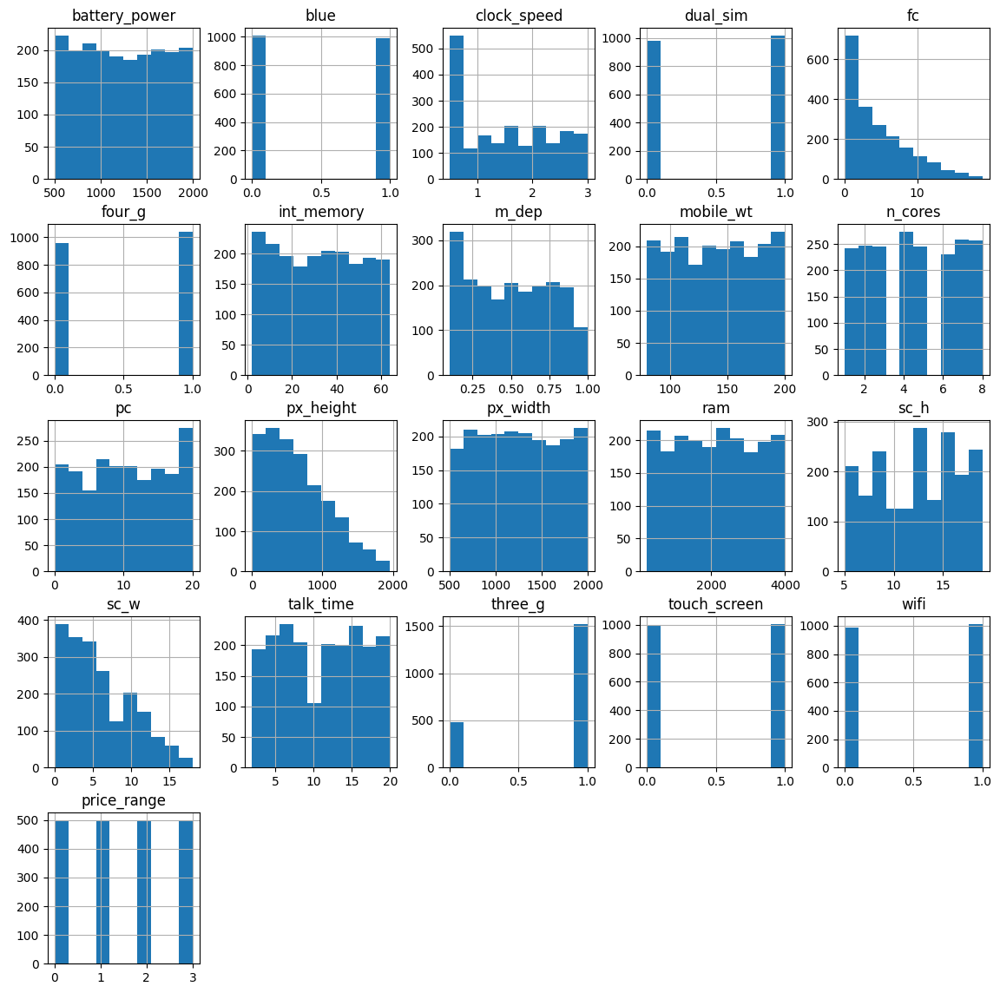

In [ ]:
# Histogramas
data.hist(figsize=(14, 14))
plt.show()

<ipython-input-11-5a6233659683>:2: FutureWarning: 

`shade` is now deprecated in favor of `fill`; setting `fill=True`.
This will become an error in seaborn v0.14.0; please update your code.

  sns.kdeplot(data['ram'], shade=True)


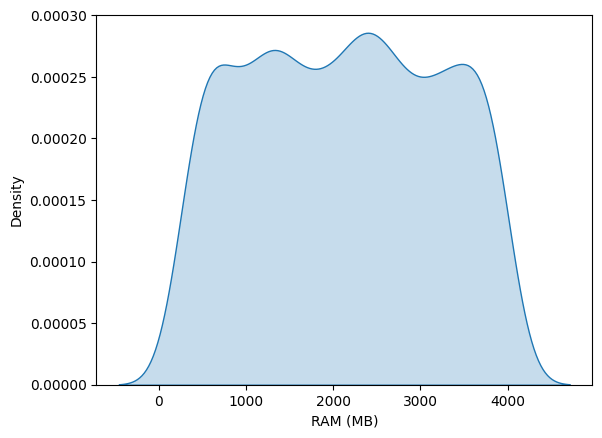

In [ ]:
# Función de densidad
sns.kdeplot(data['ram'], shade=True)
plt.xlabel('RAM (MB)')
plt.ylabel('Density')
plt.show()

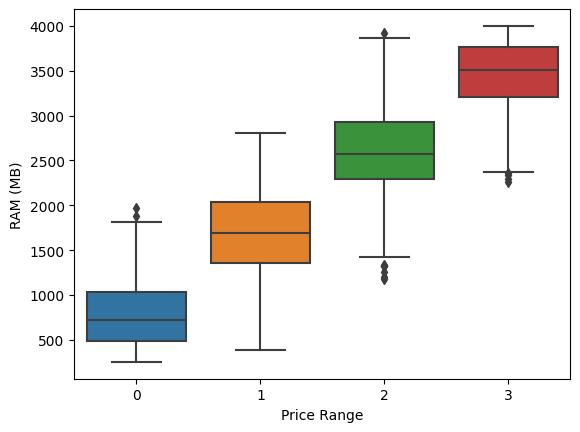

In [ ]:
# Box Plot

sns.boxplot(x='price_range', y='ram', data=data)
plt.xlabel('Price Range')
plt.ylabel('RAM (MB)')
plt.show()

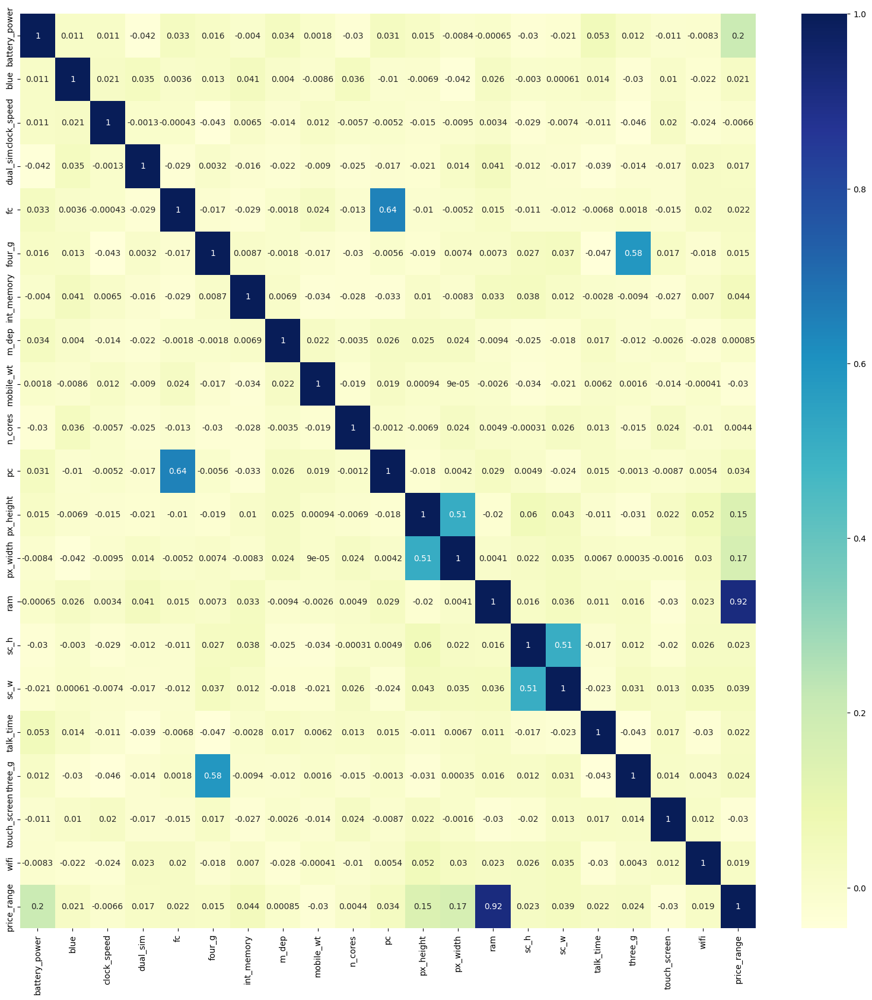

In [ ]:
# Matriz de Correlación

plt.figure(figsize  = (20,20))
sns.heatmap(data.corr(), annot = True, cmap="YlGnBu")
plt.show()

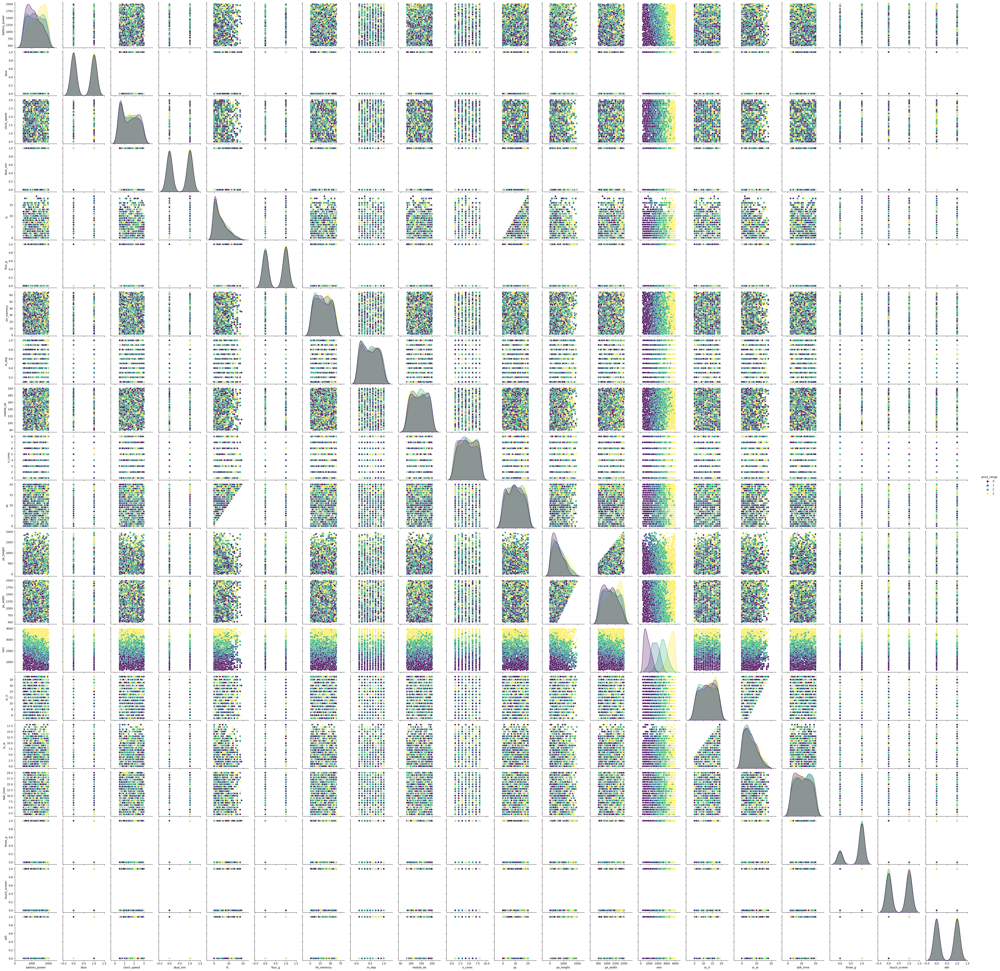

In [ ]:
# Matriz de Dispersión

sns.pairplot(data, hue='price_range', markers=["o", "s", "D", "X"], palette='viridis')
plt.show()

### **Transformación de datos (Escalamiento)**


In [ ]:
columns = ['battery_power', 'blue', 'clock_speed', 'dual_sim', 'fc', 'four_g', 'int_memory', 'm_dep', 'mobile_wt',
           'n_cores', 'pc', 'px_height', 'px_width', 'ram', 'sc_h', 'sc_w', 'talk_time', 'three_g', 'touch_screen', 'wifi']

scale_X = StandardScaler()
X = pd.DataFrame(scale_X.fit_transform(data[columns]), columns=columns)

y = data['price_range']

### **Métodos de Validación Regresión Logística**

In [ ]:
model = LogisticRegression()
scores = cross_val_score(model, X, y, cv=5)

print("Accuracy: %0.2f (+/- %0.2f)" % (scores.mean(), scores.std() * 2))

Accuracy: 0.96 (+/- 0.01)


In [ ]:
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

model = LogisticRegression()
model.fit(X_train, y_train)
y_pred = model.predict(X_test)

accuracy = accuracy_score(y_test, y_pred)
print("Accuracy:", accuracy)

Accuracy: 0.9775


In [ ]:
from sklearn.model_selection import RepeatedStratifiedKFold
cv = RepeatedStratifiedKFold(n_splits=5, n_repeats=3, random_state=42)
model = LogisticRegression()

scores = cross_val_score(model, X, y, cv=cv)
print("Mean Accuracy: %.2f" % scores.mean())

Mean Accuracy: 0.96


In [ ]:
from sklearn.model_selection import ShuffleSplit
from sklearn.linear_model import LogisticRegression

cv = ShuffleSplit(n_splits=5, test_size=0.2, random_state=42)
model = LogisticRegression()

scores = cross_val_score(model, X, y, cv=cv)
print("Mean Accuracy: %.2f" % scores.mean())

Mean Accuracy: 0.97


### **Métricas de Evaluación**

In [ ]:
model = LogisticRegression()

# Entrenar el modelo utilizando tus datos de entrenamiento (X_train y y_train)
model.fit(X_train, y_train)

# Realizar predicciones en los datos de prueba
y_pred = model.predict(X_test)

In [ ]:
from sklearn.metrics import confusion_matrix, cohen_kappa_score, roc_auc_score, roc_curve, auc
import matplotlib.pyplot as plt

# Supongamos que 'y_true' son las etiquetas verdaderas y 'y_pred' son las predicciones de tu modelo
y_true = y_test  # Reemplaza con tus datos reales
y_pred = model.predict(X_test)  # Reemplaza con las predicciones de tu modelo

# Matriz de confusión
confusion = confusion_matrix(y_true, y_pred)
print("Matriz de Confusión:")
print(confusion)

# Kappa de Cohen
kappa = cohen_kappa_score(y_true, y_pred)
print("Kappa de Cohen:", kappa)


Matriz de Confusión:
[[102   3   0   0]
 [  0  91   0   0]
 [  0   2  87   3]
 [  0   0   1 111]]
Kappa de Cohen: 0.9699222992731222


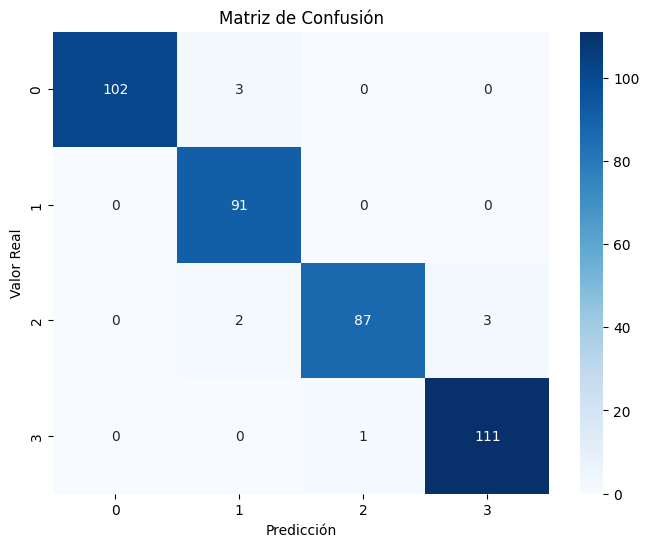

In [ ]:
confusion = confusion_matrix(y_test, y_pred)

# Crear un mapa de calor de la matriz de confusión
plt.figure(figsize=(8, 6))
sns.heatmap(confusion, annot=True, fmt='d', cmap='Blues', xticklabels=[0, 1, 2, 3], yticklabels=[0, 1, 2, 3])
plt.xlabel('Predicción')
plt.ylabel('Valor Real')
plt.title('Matriz de Confusión')
plt.show()